# Anticipez les besoins en consommation electrique de batiments

## Contexte et objectifs de l'étude

**Client** : Ville de Seattle

**Objectifs** : atteindre son objectif de ville neutre en émissions de carbone en 2050

**Outil** : Emissions des batiments non destinés à l'habitation

**Mon objectif** : Prédire les émissions de CO2 et la consommation totale d'énergie de bâtiments pour lesquels elles n'ont pas encore été mesurés  -> évaluer l'interêt de l'Energy Star Score pour la prédiction d'émissions

**Missions** :
- Réaliser une courte analyse exploratoire
- Tester différents modèles de prédiction afin de répondre au mieux à la problématique

**Points de vigilences** :
- Relevés de consommation annuels (attention aux fuite de données), possibilités de déduire des variables plus simples (nature et proportions des sources d'énergies utiles)
- Traitement des variables pour trouver de nouvelles informations (normalisation, log...)
- Mise en place d'une évaluation rigoureuse et optimisation des hyperparamètres et choix du modèle de machine learning avec la validation croisée

In [2]:
import pandas as pd
import numpy as np
import sklearn as sk
import seaborn as sns
import matplotlib.pyplot as plt
import scipy as sc
import plotly.express as px
import plotly.graph_objects as go
from datetime import datetime
import category_encoders as ce
from plotly.subplots import make_subplots
from sklearn.svm import SVC
# options pandas pour lire entièrement les fichiers au moins jusqu'à 999 lignes et 999 colonnes
pd.options.display.max_rows = 500000
pd.options.display.max_columns = 500000
%matplotlib inline

In [3]:
data1 = pd.read_csv("2015-building-energy-benchmarking.csv")
print(data1.shape)
print(round(data1.isnull().sum().sum()/data1.size*100))

(3340, 47)
17


Le jeu de donnée en 2015 présente 3340 lignes et 47 colonnes et 17% de valeurs manquantes

In [4]:
data2 = pd.read_csv("2016-building-energy-benchmarking.csv")
print(data2.shape)
print(round(data2.isnull().sum().sum()/data1.size*100))

(3376, 46)
13


le jeu de donnée en 2016 présente 3376 lignes et 46 colonnes et 13% de valeurs manquantes

In [4]:
data1.head(2)

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,TaxParcelIdentificationNumber,Location,CouncilDistrictCode,Neighborhood,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),OtherFuelUse(kBtu),GHGEmissions(MetricTonsCO2e),GHGEmissionsIntensity(kgCO2e/ft2),DefaultData,Comment,ComplianceStatus,Outlier,2010 Census Tracts,Seattle Police Department Micro Community Policing Plan Areas,City Council Districts,SPD Beats,Zip Codes
0,1,2015,NonResidential,Hotel,MAYFLOWER PARK HOTEL,659000030,"{'latitude': '47.61219025', 'longitude': '-122...",7,DOWNTOWN,1927,1,12.0,88434,0,88434,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN,NaN,65.0,78.9,80.3,173.5,175.1,6981428.0,7097539.0,2023032.0,1080307.0,3686160.0,12724.0,1272388.0,0.0,249.43,2.64,No,NaN,Compliant,NaN,NaN,14.0,NaN,31.0,18081
1,2,2015,NonResidential,Hotel,PARAMOUNT HOTEL,659000220,"{'latitude': '47.61310583', 'longitude': '-122...",7,DOWNTOWN,1996,1,11.0,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.0,Parking,15064.0,Restaurant,4622.0,NaN,51.0,94.4,99.0,191.3,195.2,8354235.0,8765788.0,0.0,1144563.0,3905411.0,44490.0,4448985.0,0.0,263.51,2.38,No,NaN,Compliant,NaN,NaN,14.0,NaN,31.0,18081


In [5]:
data2.head(2)

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.0,0659000030,7,DOWNTOWN,47.61220,-122.33799,1927,1.0,12,88434,0,88434,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN,NaN,60.0,81.699997,84.300003,182.500000,189.000000,7226362.5,7456910.0,2003882.0,1.156514e+06,3946027.0,12764.52930,1276453.0,False,NaN,Compliant,NaN,249.98,2.83
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.0,0659000220,7,DOWNTOWN,47.61317,-122.33393,1996,1.0,11,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.0,Parking,15064.0,Restaurant,4622.0,NaN,61.0,94.800003,97.900002,176.100006,179.399994,8387933.0,8664479.0,0.0,9.504252e+05,3242851.0,51450.81641,5145082.0,False,NaN,Compliant,NaN,295.86,2.86


In [6]:
data1.nunique(axis = 0)

OSEBuildingID                                                    3340
DataYear                                                            1
BuildingType                                                        7
PrimaryPropertyType                                                27
PropertyName                                                     3287
TaxParcelIdentificationNumber                                    3245
Location                                                         3298
CouncilDistrictCode                                                 7
Neighborhood                                                       13
YearBuilt                                                         113
NumberofBuildings                                                  10
NumberofFloors                                                     50
PropertyGFATotal                                                 3150
PropertyGFAParking                                                908
PropertyGFABuilding(

In [7]:
data2.nunique()

OSEBuildingID                      3376
DataYear                              1
BuildingType                          8
PrimaryPropertyType                  24
PropertyName                       3362
Address                            3354
City                                  1
State                                 1
ZipCode                              55
TaxParcelIdentificationNumber      3268
CouncilDistrictCode                   7
Neighborhood                         19
Latitude                           2876
Longitude                          2656
YearBuilt                           113
NumberofBuildings                    17
NumberofFloors                       50
PropertyGFATotal                   3195
PropertyGFAParking                  496
PropertyGFABuilding(s)             3193
ListOfAllPropertyUseTypes           466
LargestPropertyUseType               56
LargestPropertyUseTypeGFA          3122
SecondLargestPropertyUseType         50
SecondLargestPropertyUseTypeGFA    1352


On remarque que 'GHGEmissions(MetricTonsCO2e)' et 'TotalGHGEmissions' sont les mêmes variable. Les deux présente l'émissions de gaz à effet de serre totale sur l'année 2015 et 2016 des différents batiments.

## Comprendre les jeu de données de 2015 et 2016

### Traitement des données

#### Valeurs manquantes

In [8]:
def missings_value(data1): 
    mis_val = data1.isnull().sum()
    mis_val_percent = 100 * data1.isnull().sum() / len(data1) #pourcentage de valeurs manquantes
    mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)# concaténation du nombre de valeur manquante et des pourcentages respectif

    mis_val_table_ren_columns = mis_val_table.rename(columns = {0 : 'Valeurs manquantes', 1 : '% de valeurs manquantes'})

    mis_val_table_ren_columns = mis_val_table_ren_columns[mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
            '% de valeurs manquantes', ascending=False).round(1)

    print ("Le jeu de donnée seléctionné a  " + str(data1.shape[1]) + " columns.\n"      
                "Il y a " + str(mis_val_table_ren_columns.shape[0]) +
                  " colonnes avec des valeurs manquantes.")


    return mis_val_table_ren_columns

In [9]:
missings_value(data1)

Le jeu de donnée seléctionné a  47 columns.
Il y a 32 colonnes avec des valeurs manquantes.


,Valeurs manquantes,% de valeurs manquantes
Comment,3327,99.6
Outlier,3256,97.5
YearsENERGYSTARCertified,3230,96.7
City Council Districts,3127,93.6
2010 Census Tracts,3116,93.3
ThirdLargestPropertyUseType,2780,83.2
ThirdLargestPropertyUseTypeGFA,2780,83.2
SecondLargestPropertyUseType,1781,53.3
SecondLargestPropertyUseTypeGFA,1781,53.3
ENERGYSTARScore,780,23.4


In [10]:
#2016
missings_value(data2)

Le jeu de donnée seléctionné a  46 columns.
Il y a 26 colonnes avec des valeurs manquantes.


,Valeurs manquantes,% de valeurs manquantes
Comments,3376,100.0
Outlier,3344,99.1
YearsENERGYSTARCertified,3257,96.5
ThirdLargestPropertyUseTypeGFA,2780,82.3
ThirdLargestPropertyUseType,2780,82.3
SecondLargestPropertyUseType,1697,50.3
SecondLargestPropertyUseTypeGFA,1697,50.3
ENERGYSTARScore,843,25.0
LargestPropertyUseType,20,0.6
LargestPropertyUseTypeGFA,20,0.6


Je supprime les lignes ou les valeurs de la colonne Outlier sont égales a High Outlier et Low Outlier

In [5]:
indexOutlier = data1.dropna(subset = ['Outlier']).index
data1.drop(indexOutlier, inplace = True)

In [6]:
data1.shape

(3256, 47)

In [7]:
indexOutlier2 = data2.dropna(subset = ['Outlier']).index
data2.drop(indexOutlier2, inplace = True)

In [8]:
data2.shape

(3344, 46)

Compréhension des colonnes qui vont être supprimé : 2010 Census Tracts : région géographique définie pour faire un recensement
        city council district : le conseil général du quartier
        Outlier : les valeurs aberrantes
        comments : autre commentaire 100%nan

Je supprime les colonnes contenant plus de 50% de valeurs manquantes

In [9]:
def supprimer_valeur_manquante(df1, df2):
    column_with_nan1 = df1.columns[df1.isnull().any()]
    column_with_nan2 = df2.columns[df2.isnull().any()]
    for column in column_with_nan1:
         if df1[column].isnull().sum()*100.0/df1.shape[0] > 50:
                 df1.drop(column,1, inplace=True)
    for column in column_with_nan2:
        if df2[column].isnull().sum()*100.0/df2.shape[0] >50:
            df2.drop(column,1,inplace=True)

In [10]:
supprimer_valeur_manquante(data1, data2)

In [11]:
mean1 = data1["NumberofBuildings"].mean()
data1["NumberofBuildings"] = data1["NumberofBuildings"].fillna(value = mean1)
mean2 = data2["NumberofBuildings"].mean()
data2["NumberofBuildings"] = data2["NumberofBuildings"].fillna(value = mean2)

Je vais remplir la plupart des valeurs manquantes par la médiane 

In [12]:
colonnes_mediane_nan = ['SiteEUI(kBtu/sf)',
       'SiteEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)', 'SourceEUIWN(kBtu/sf)',
       'SiteEnergyUse(kBtu)', 'SiteEnergyUseWN(kBtu)', 'SteamUse(kBtu)',
       'Electricity(kWh)', 'Electricity(kBtu)', 'NaturalGas(therms)',
       'NaturalGas(kBtu)', 'OtherFuelUse(kBtu)','ENERGYSTARScore',
       'GHGEmissions(MetricTonsCO2e)', 'GHGEmissionsIntensity(kgCO2e/ft2)',]
colonnes_mediane_nan2 = ['SiteEUI(kBtu/sf)', 'NaturalGas(kBtu)',
       'SiteEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)', 'SourceEUIWN(kBtu/sf)',
       'SiteEnergyUse(kBtu)', 'SiteEnergyUseWN(kBtu)', 'SteamUse(kBtu)','ENERGYSTARScore',
       'Electricity(kWh)', 'Electricity(kBtu)', 'NaturalGas(therms)','TotalGHGEmissions', 'GHGEmissionsIntensity']

In [13]:
for col in colonnes_mediane_nan :
    median = data1[colonnes_mediane_nan].median()
    # Remplacer les valeurs manquantes par un nombre
    data1[colonnes_mediane_nan] = data1[colonnes_mediane_nan].fillna(value = median)

In [14]:
data1[colonnes_mediane_nan].isnull().sum()

SiteEUI(kBtu/sf)                     0
SiteEUIWN(kBtu/sf)                   0
SourceEUI(kBtu/sf)                   0
SourceEUIWN(kBtu/sf)                 0
SiteEnergyUse(kBtu)                  0
SiteEnergyUseWN(kBtu)                0
SteamUse(kBtu)                       0
Electricity(kWh)                     0
Electricity(kBtu)                    0
NaturalGas(therms)                   0
NaturalGas(kBtu)                     0
OtherFuelUse(kBtu)                   0
ENERGYSTARScore                      0
GHGEmissions(MetricTonsCO2e)         0
GHGEmissionsIntensity(kgCO2e/ft2)    0
dtype: int64

In [14]:
for col in colonnes_mediane_nan2 :
    median2 = data2[colonnes_mediane_nan2].median()
    # Remplacer les valeurs manquantes par un nombre
    data2[colonnes_mediane_nan2] =  data2[colonnes_mediane_nan2].fillna(median2)

In [15]:
  data2[colonnes_mediane_nan2].isnull().sum()

SiteEUI(kBtu/sf)         0
NaturalGas(kBtu)         0
SiteEUIWN(kBtu/sf)       0
SourceEUI(kBtu/sf)       0
SourceEUIWN(kBtu/sf)     0
SiteEnergyUse(kBtu)      0
SiteEnergyUseWN(kBtu)    0
SteamUse(kBtu)           0
ENERGYSTARScore          0
Electricity(kWh)         0
Electricity(kBtu)        0
NaturalGas(therms)       0
TotalGHGEmissions        0
GHGEmissionsIntensity    0
dtype: int64

In [16]:
print('2015 : ', data1.shape)
print('2015 : ',round( data1.isnull().sum().sum()/data1.size*100))

2015 :  (3256, 38)
2015 :  0


In [17]:
print('2016 :',data2.shape)
print('2016:' , round(data2.isnull().sum().sum()/data1.size*100))

2016 : (3344, 39)
2016: 0


SPD Beats est la puissance par unité de surface par longueur d'onde unitaire
Je supprime les colonnes qui ne me servent pas comme "Default Data" , "TaxParcelIdentification Number", "Seattle Police Department Micro Community Plan Area" pour le jeu de donnée 2015 
Je supprime également les colonnes qui ne me servent pas dans le jeu de donnée 2016 : "ZipCode" , "Number of Buildings"

In [18]:
data1 = data1.drop(columns = ["DefaultData", "TaxParcelIdentificationNumber","Seattle Police Department Micro Community Policing Plan Areas"], axis = 1)


In [19]:
print('2015 : ', data1.shape)
print('2015 : ',round( data1.isnull().sum().sum()/data1.size*100))

2015 :  (3256, 35)
2015 :  0


In [20]:
data2 = data2.drop([ 'DefaultData', 'ComplianceStatus',
       'City', 'State', 'ZipCode',
       'TaxParcelIdentificationNumber', 'CouncilDistrictCode', 'DataYear'], axis = 1)

In [21]:
print('2016 :',data2.shape)
print('2016:' , round(data2.isnull().sum().sum()/data1.size*100))

2016 : (3344, 31)
2016: 0


#### Valeurs aberrantes

In [26]:
#selectionner les colonnes numeriques et colonnes categorielles
data1_numerique = data1.select_dtypes(include=[np.number])
num_cols = data1_numerique.columns.values
data1_categ = data1.select_dtypes(exclude=[np.number])
categ_cols = data1_categ.columns.values
print(num_cols)
print('\n')
print(categ_cols)

['OSEBuildingID' 'DataYear' 'CouncilDistrictCode' 'YearBuilt'
 'NumberofBuildings' 'NumberofFloors' 'PropertyGFATotal'
 'PropertyGFAParking' 'PropertyGFABuilding(s)' 'LargestPropertyUseTypeGFA'
 'ENERGYSTARScore' 'SiteEUI(kBtu/sf)' 'SiteEUIWN(kBtu/sf)'
 'SourceEUI(kBtu/sf)' 'SourceEUIWN(kBtu/sf)' 'SiteEnergyUse(kBtu)'
 'SiteEnergyUseWN(kBtu)' 'SteamUse(kBtu)' 'Electricity(kWh)'
 'Electricity(kBtu)' 'NaturalGas(therms)' 'NaturalGas(kBtu)'
 'OtherFuelUse(kBtu)' 'GHGEmissions(MetricTonsCO2e)'
 'GHGEmissionsIntensity(kgCO2e/ft2)' 'SPD Beats' 'Zip Codes']


['BuildingType' 'PrimaryPropertyType' 'PropertyName' 'Location'
 'Neighborhood' 'ListOfAllPropertyUseTypes' 'LargestPropertyUseType'
 'ComplianceStatus']


In [27]:
data2_numerique = data2.select_dtypes(include=[np.number])
num_cols2 = data2_numerique.columns.values
data2_categ = data2.select_dtypes(exclude=[np.number])
categ_cols2 = data2_categ.columns.values
print(num_cols2)
print('\n')
print(categ_cols2)

['OSEBuildingID' 'Latitude' 'Longitude' 'YearBuilt' 'NumberofBuildings'
 'NumberofFloors' 'PropertyGFATotal' 'PropertyGFAParking'
 'PropertyGFABuilding(s)' 'LargestPropertyUseTypeGFA' 'ENERGYSTARScore'
 'SiteEUI(kBtu/sf)' 'SiteEUIWN(kBtu/sf)' 'SourceEUI(kBtu/sf)'
 'SourceEUIWN(kBtu/sf)' 'SiteEnergyUse(kBtu)' 'SiteEnergyUseWN(kBtu)'
 'SteamUse(kBtu)' 'Electricity(kWh)' 'Electricity(kBtu)'
 'NaturalGas(therms)' 'NaturalGas(kBtu)' 'TotalGHGEmissions'
 'GHGEmissionsIntensity']


['BuildingType' 'PrimaryPropertyType' 'PropertyName' 'Address'
 'Neighborhood' 'ListOfAllPropertyUseTypes' 'LargestPropertyUseType']


In [27]:
print(data1['BuildingType'].unique())
print(data2['BuildingType'].unique())

['NonResidential' 'Nonresidential COS' 'Multifamily MR (5-9)'
 'SPS-District K-12' 'Multifamily LR (1-4)' 'Campus'
 'Multifamily HR (10+)']
['NonResidential' 'Nonresidential COS' 'Multifamily MR (5-9)'
 'SPS-District K-12' 'Campus' 'Multifamily LR (1-4)'
 'Multifamily HR (10+)' 'Nonresidential WA']


In [28]:
print(data1['PrimaryPropertyType'].unique())
print(data2['PrimaryPropertyType'].unique())

['Hotel' 'Other' 'Mid-Rise Multifamily' 'Mixed Use Property' 'K-12 School'
 'College/University' 'Small- and Mid-Sized Office'
 'Self-Storage Facility' 'Distribution Center' 'Large Office'
 'Retail Store' 'Low-Rise Multifamily' 'Senior Care Community'
 'Medical Office' 'Hospital' 'Residence Hall/Dormitory'
 'Non-Refrigerated Warehouse' 'SPS-District K-12' 'Worship Facility'
 'Supermarket/Grocery Store' 'Laboratory' 'Refrigerated Warehouse'
 'High-Rise Multifamily' 'Restaurant']
['Hotel' 'Other' 'Mid-Rise Multifamily' 'Mixed Use Property' 'K-12 School'
 'University' 'Small- and Mid-Sized Office' 'Self-Storage Facility'
 'Warehouse' 'Large Office' 'Senior Care Community' 'Medical Office'
 'Retail Store' 'Hospital' 'Residence Hall' 'Distribution Center'
 'Worship Facility' 'Low-Rise Multifamily' 'Supermarket / Grocery Store'
 'Laboratory' 'Refrigerated Warehouse' 'Restaurant'
 'High-Rise Multifamily' 'Office']


In [29]:
data1['PrimaryPropertyType'] = data1['PrimaryPropertyType'].str.strip()

In [30]:
for x in data1_categ:
    print( '\n\n' + x + ':  \n' + str(data1_categ[x].unique()))



BuildingType:  
['NonResidential' 'Nonresidential COS' 'Multifamily MR (5-9)'
 'SPS-District K-12' 'Multifamily LR (1-4)' 'Campus'
 'Multifamily HR (10+)']


PrimaryPropertyType:  
['Hotel' 'Other' 'Mid-Rise Multifamily' 'Mixed Use Property' 'K-12 School'
 'College/University' 'Small- and Mid-Sized Office'
 'Self-Storage Facility' 'Distribution Center' 'Large Office'
 'Retail Store' 'Low-Rise Multifamily' 'Senior Care Community'
 'Medical Office' 'Hospital' 'Residence Hall/Dormitory'
 'Non-Refrigerated Warehouse' 'SPS-District K-12' 'Worship Facility'
 'Supermarket/Grocery Store' 'Laboratory' 'Refrigerated Warehouse'
 'High-Rise Multifamily' 'Restaurant']


PropertyName:  
['MAYFLOWER PARK HOTEL' 'PARAMOUNT HOTEL' 'WESTIN HOTEL' ... 'CIRRUS'
 'WEDGEWOOD ESTATES BLDG A' 'WEDGEWOOD ESTATES BLDG B']


Location:  
['{\'latitude\': \'47.61219025\', \'longitude\': \'-122.33799744\', \'human_address\': \'{"address": "405 OLIVE WAY", "city": "SEATTLE", "state": "WA", "zip": "98101"}\'}'
 '{\

In [22]:
data1['PrimaryPropertyType'].replace( 'Self-Storage Facility\n', 'Self-Storage Facility', inplace=True)
data1['PrimaryPropertyType'].replace( 'Distribution Center\n', 'Distribution Center', inplace=True)
data1['PrimaryPropertyType'].replace( 'Restaurant\n', 'Restaurant', inplace=True)

In [23]:
data1['PrimaryPropertyType'].unique()

array(['Hotel', 'Other', 'Mid-Rise Multifamily', 'Mixed Use Property',
       'K-12 School', 'College/University', 'Small- and Mid-Sized Office',
       'Self-Storage Facility', 'Distribution Center', 'Large Office',
       'Retail Store', 'Low-Rise Multifamily', 'Senior Care Community',
       'Medical Office', 'Hospital', 'Residence Hall/Dormitory',
       'Non-Refrigerated Warehouse', 'SPS-District K-12',
       'Worship Facility', 'Supermarket/Grocery Store', 'Laboratory',
       'Refrigerated Warehouse', 'High-Rise Multifamily', 'Restaurant'],
      dtype=object)

In [24]:
data2['PrimaryPropertyType'] = data2['PrimaryPropertyType'].str.strip()

In [28]:
for x in data2_categ:
    print( '\n\n' + x + ':  \n' + str(data2_categ[x].unique()))



BuildingType:  
['NonResidential' 'Nonresidential COS' 'Multifamily MR (5-9)'
 'SPS-District K-12' 'Campus' 'Multifamily LR (1-4)'
 'Multifamily HR (10+)' 'Nonresidential WA']


PrimaryPropertyType:  
['Hotel' 'Other' 'Mid-Rise Multifamily' 'Mixed Use Property' 'K-12 School'
 'University' 'Small- and Mid-Sized Office' 'Self-Storage Facility'
 'Warehouse' 'Large Office' 'Senior Care Community' 'Medical Office'
 'Retail Store' 'Hospital' 'Residence Hall' 'Distribution Center'
 'Worship Facility' 'Low-Rise Multifamily' 'Supermarket / Grocery Store'
 'Laboratory' 'Refrigerated Warehouse' 'Restaurant'
 'High-Rise Multifamily' 'Office']


PropertyName:  
['Mayflower park hotel' 'Paramount Hotel' '5673-The Westin Seattle' ...
 'Queen Anne Pool' 'South Park Community Center'
 'Van Asselt Community Center']


Address:  
['405 Olive way' '724 Pine street' '1900 5th Avenue' ... '1920 1st Ave W'
 '8319 8th Ave S' '2820 S Myrtle St']


Neighborhood:  
['DOWNTOWN' 'SOUTHEAST' 'NORTHEAST' 'EAST' 'C

In [29]:
data2['Neighborhood'] = data2['Neighborhood'].str.lower()

In [30]:
data2['Neighborhood'].unique()

array(['downtown', 'southeast', 'northeast', 'east', 'central', 'north',
       'magnolia / queen anne', 'lake union', 'greater duwamish',
       'ballard', 'northwest', 'southwest', 'delridge',
       'delridge neighborhoods'], dtype=object)

In [37]:
print("Type de batiment priotaire 1\n", data1['PrimaryPropertyType'].value_counts())
print('\n')
print("Type de batiment prioritaire 2\n",data2['PrimaryPropertyType'].value_counts())

Type de batiment priotaire 1
 Low-Rise Multifamily           965
Mid-Rise Multifamily           522
Small- and Mid-Sized Office    284
Other                          258
Non-Refrigerated Warehouse     187
Large Office                   161
K-12 School                    134
Mixed Use Property             126
High-Rise Multifamily          100
Retail Store                    96
Worship Facility                72
Hotel                           71
Distribution Center             53
Medical Office                  43
Senior Care Community           43
Supermarket/Grocery Store       36
Self-Storage Facility           28
College/University              22
Residence Hall/Dormitory        15
Refrigerated Warehouse          13
Restaurant                      12
Hospital                        10
SPS-District K-12                4
Laboratory                       1
Name: PrimaryPropertyType, dtype: int64


Type de batiment prioritaire 2
 Low-Rise Multifamily           975
Mid-Rise Multifamily 

### Analyse des données

#### Analyse Univariée

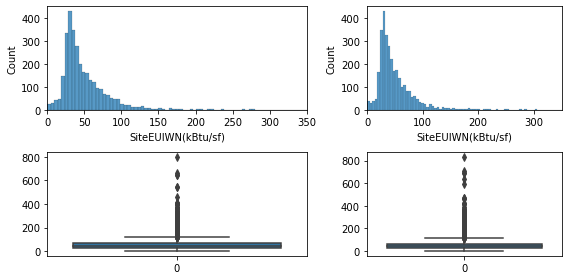

In [39]:
f, axs = plt.subplots(2, 2, figsize=(8, 4), gridspec_kw=dict(width_ratios=[4, 3]))
g1 = sns.histplot(data=data1["SiteEUIWN(kBtu/sf)"], ax=axs[0,0])
g1.set(xlim=(0, 350))
g2 = sns.histplot(data=data2["SiteEUIWN(kBtu/sf)"], ax=axs[0,1])
g2.set(xlim=(0, 350))
sns.boxplot(ax=axs[1,0], data=data1["SiteEUIWN(kBtu/sf)"])
sns.boxplot(ax=axs[1,1], data=data2["SiteEUIWN(kBtu/sf)"])
f.tight_layout()

La variable "SiteEUIWN(kBtu/sf)" possède une distribution a gauche avec une queue étalée vers la droite

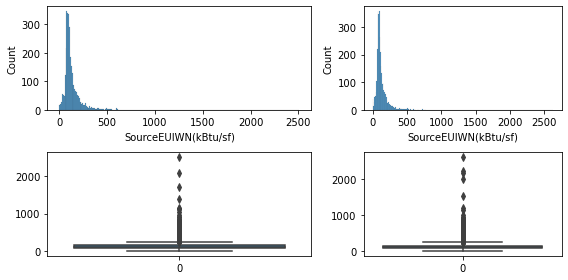

In [43]:
f, axs = plt.subplots(2, 2, figsize=(8, 4), gridspec_kw=dict(width_ratios=[4, 3]))
sns.histplot(data=data1["SourceEUIWN(kBtu/sf)"], ax=axs[0,0])
sns.histplot(data=data2["SourceEUIWN(kBtu/sf)"], ax=axs[0,1])
sns.boxplot(ax=axs[1,0], data=data1["SourceEUIWN(kBtu/sf)"])
sns.boxplot(ax=axs[1,1], data=data2["SourceEUIWN(kBtu/sf)"])
f.tight_layout()

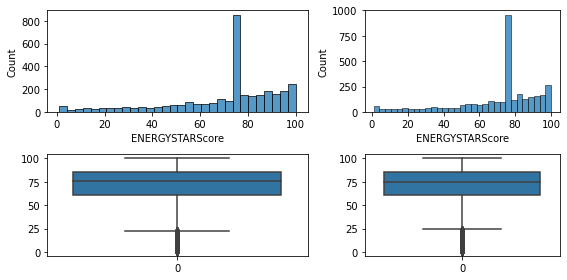

In [44]:
f, axs = plt.subplots(2, 2, figsize=(8, 4), gridspec_kw=dict(width_ratios=[4, 3]))
sns.histplot(data=data1["ENERGYSTARScore"], ax=axs[0,0])
sns.histplot(data=data2["ENERGYSTARScore"], ax=axs[0,1])
sns.boxplot(ax=axs[1,0], data=data1["ENERGYSTARScore"])
sns.boxplot(ax=axs[1,1], data=data2["ENERGYSTARScore"])
f.tight_layout()

In [45]:
data1["ENERGYSTARScore"].describe()

count    3256.000000
mean       70.000307
std        23.448391
min         1.000000
25%        60.750000
50%        76.000000
75%        86.000000
max       100.000000
Name: ENERGYSTARScore, dtype: float64

In [46]:
data2["ENERGYSTARScore"].describe()

count    3344.000000
mean       69.617823
std        23.344918
min         1.000000
25%        61.000000
50%        75.000000
75%        85.000000
max       100.000000
Name: ENERGYSTARScore, dtype: float64

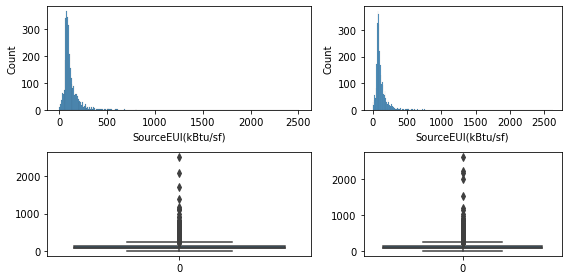

In [47]:
f, axs = plt.subplots(2, 2, figsize=(8, 4), gridspec_kw=dict(width_ratios=[4, 3]))
sns.histplot(data = data1["SourceEUI(kBtu/sf)"], ax=axs[0,0])
sns.histplot(data = data2["SourceEUI(kBtu/sf)"], ax=axs[0,1])
sns.boxplot(ax=axs[1,0], data=data1["SourceEUI(kBtu/sf)"])
sns.boxplot(ax=axs[1,1], data=data2["SourceEUI(kBtu/sf)"])
f.tight_layout()

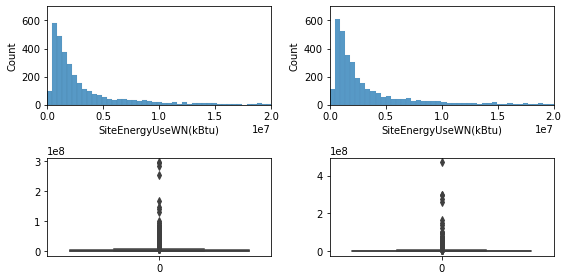

In [70]:
#variable cible
f, axs = plt.subplots(2, 2, figsize=(8, 4), gridspec_kw=dict(width_ratios=[2, 2]))
l1=sns.histplot(data=data1["SiteEnergyUseWN(kBtu)"], ax=axs[0,0])
l1.set(ylim = (0.0,700))
l1.set(xlim = (0.0,2*1e7))

l2=sns.histplot(data=data2["SiteEnergyUseWN(kBtu)"], ax=axs[0,1])
l2.set(ylim = (0.0,700))
l2.set(xlim = (0.0,2*1e7))
sns.boxplot(ax=axs[1,0], data=data1["SiteEnergyUseWN(kBtu)"])
sns.boxplot(ax=axs[1,1], data=data2["SiteEnergyUseWN(kBtu)"])
f.tight_layout()

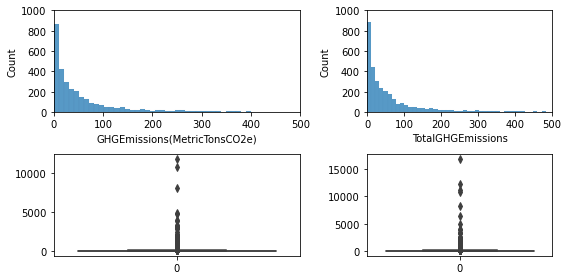

In [79]:
#variable cible
f, axs = plt.subplots(2, 2, figsize=(8, 4), gridspec_kw=dict(width_ratios=[4, 3]))
h1 =sns.histplot(data = data1['GHGEmissions(MetricTonsCO2e)'], ax=axs[0,0])
h1.set(xlim =(0.0,500))
h1.set(ylim =(0.0,1000))

h2 =sns.histplot(data = data2['TotalGHGEmissions'], ax=axs[0,1])
h2.set(xlim= (0.0,500))
h2.set(ylim =(0.0,1000))
sns.boxplot(ax=axs[1,0], data=data1['GHGEmissions(MetricTonsCO2e)'])
sns.boxplot(ax=axs[1,1], data=data2['TotalGHGEmissions'])
f.tight_layout()

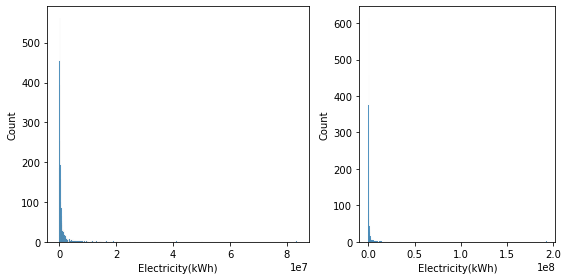

In [50]:
f, axs = plt.subplots(1, 2, figsize=(8, 4), gridspec_kw=dict(width_ratios=[4, 3]))
sns.histplot(data = data1["Electricity(kWh)"], ax=axs[0])
sns.histplot(data = data2["Electricity(kWh)"], ax=axs[1])
f.tight_layout()

In [51]:
labels = ['NonResidential', 'Nonresidential COS',' Multifamily MR (5-9)', 'Multifamily LR (1-4)',' SPS-District K-12',' Campus','Multifamily HR (10+)']
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'domain'}, {'type':'domain'}]])
fig.add_trace(go.Pie(labels=labels, values=data1['BuildingType'].value_counts()),
              1, 1)
fig.add_trace(go.Pie(labels=labels, values=data2['BuildingType'].value_counts()),
              1, 2)
fig.update_traces(hole=.4, hoverinfo="label+percent+name")
fig.update_layout(
    title_text="Répartitions des différents types de batiments en 2015 et 2016",
        annotations=[dict(text='2015', x=0.18, y=0.5, font_size=20, showarrow=False),
                 dict(text='2016', x=0.82, y=0.5, font_size=20, showarrow=False)])
fig.update_traces(hole=.4, hoverinfo="label+percent+name")
fig.update_layout(
    title_text="Répartitions des différents types de batiments en 2015 et 2016",
        annotations=[dict(text='2015', x=0.18, y=0.5, font_size=20, showarrow=False),
                 dict(text='2016', x=0.82, y=0.5, font_size=20, showarrow=False)])
fig.show()

In [52]:
labels = ['NonResidential', 'Nonresidential COS',' Multifamily MR (5-9)', 'Multifamily LR (1-4)',' SPS-District K-12',' Campus','Multifamily HR (10+)']
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'domain'}, {'type':'domain'}]])
fig.add_trace(go.Pie(labels=labels, values=data1["SiteEnergyUseWN(kBtu)"].value_counts()),
              1, 1)
fig.add_trace(go.Pie(labels=labels, values=data2["SiteEnergyUseWN(kBtu)"].value_counts()),
              1, 2)
fig.update_traces(hole=.4, hoverinfo="label+percent+name")
fig.update_layout(
    title_text="Consommation de l'énergie par GFA en fonction des types de batiments en 2015 et 2016",
        annotations=[dict(text='EUI 2015', x=0.18, y=0.5, font_size=10, showarrow=False),
                 dict(text='EUI 2016', x=0.82, y=0.5, font_size=10, showarrow=False)])
fig.show()

In [53]:
labels = ['NonResidential', 'Nonresidential COS',' Multifamily MR (5-9)', 'Multifamily LR (1-4)',' SPS-District K-12',' Campus','Multifamily HR (10+)']
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'domain'}, {'type':'domain'}]])
fig.add_trace(go.Pie(labels=labels, values=data1['GHGEmissions(MetricTonsCO2e)'].value_counts()),
              1, 1)
fig.add_trace(go.Pie(labels=labels, values=data2['TotalGHGEmissions'].value_counts()),
              1, 2)
fig.update_traces(hole=.4, hoverinfo="label+percent+name")
fig.update_layout(
    title_text="Emission de gaz à effet de serre en fonction des types de batiments en 2015 et 2016",
        annotations=[dict(text='GHG 2015', x=0.18, y=0.5, font_size=10, showarrow=False),
                 dict(text='GHG 2016', x=0.82, y=0.5, font_size=10, showarrow=False)])
fig.show()

#### Analyse Bivariée

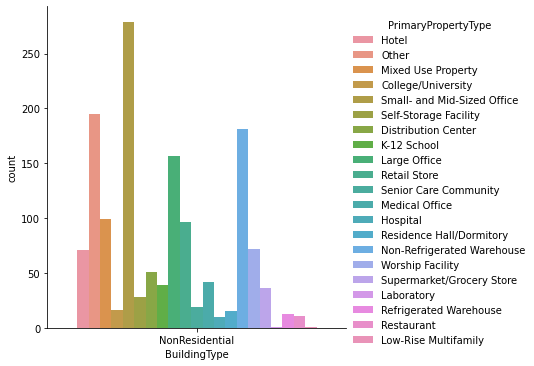

In [54]:
g = sns.catplot(x="BuildingType", hue="PrimaryPropertyType", data=data1[data1["BuildingType"] == "NonResidential"], kind = 'count', legend_out = True)

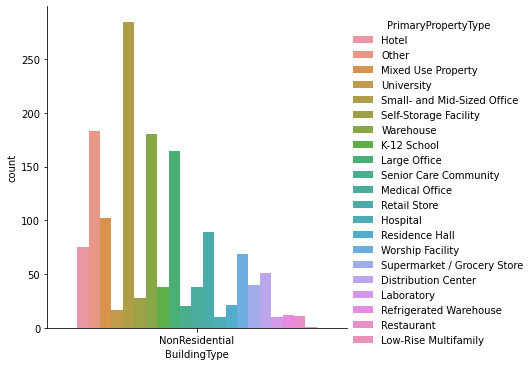

In [55]:
g = sns.catplot(x="BuildingType", hue="PrimaryPropertyType", data=data2[data2["BuildingType"] == "NonResidential"], kind = 'count', legend_out = True)

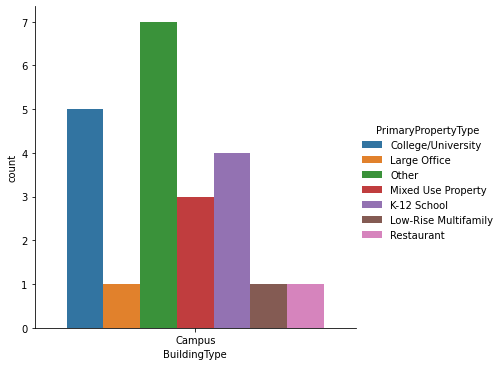

In [56]:
g = sns.catplot(x="BuildingType", hue="PrimaryPropertyType", data=data1[data1["BuildingType"] == "Campus"], kind = 'count', legend_out = True)

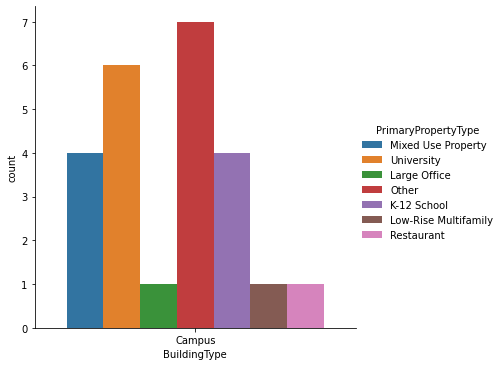

In [57]:
g = sns.catplot(x="BuildingType", hue="PrimaryPropertyType", data=data2[data2["BuildingType"] == "Campus"], kind = 'count', legend_out = True)

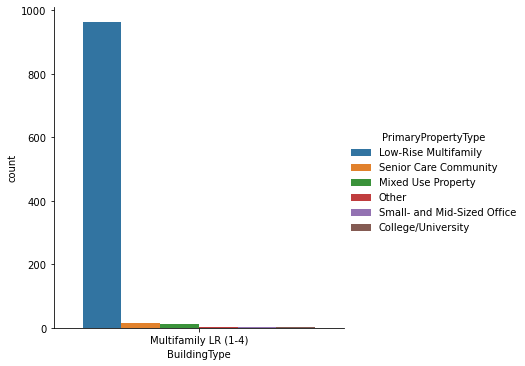

In [58]:
g = sns.catplot(x="BuildingType", hue="PrimaryPropertyType", data=data1[data1["BuildingType"] == "Multifamily LR (1-4)"], kind = 'count', legend_out = True)

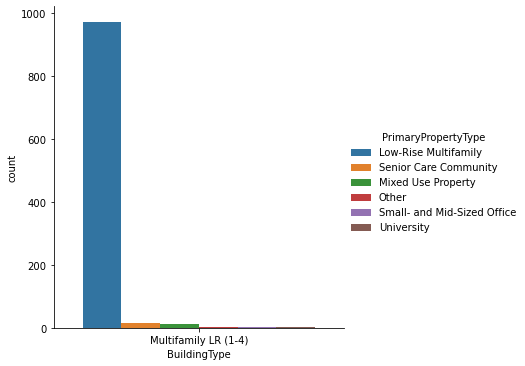

In [59]:
g = sns.catplot(x="BuildingType", hue="PrimaryPropertyType", data=data2[data2["BuildingType"] == "Multifamily LR (1-4)"], kind = 'count', legend_out = True)

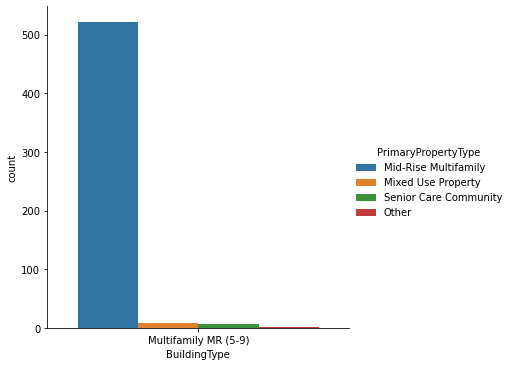

In [60]:
g = sns.catplot(x="BuildingType", hue="PrimaryPropertyType", data=data1[data1["BuildingType"] == "Multifamily MR (5-9)"], kind = 'count', legend_out = True)

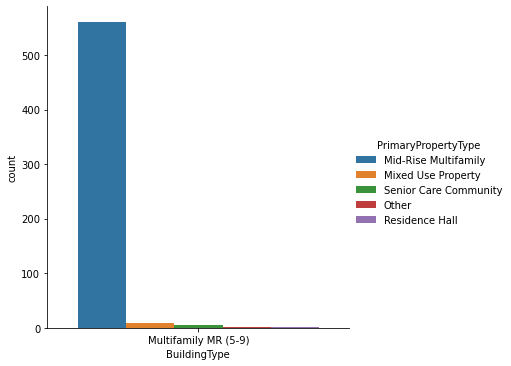

In [61]:
g = sns.catplot(x="BuildingType", hue="PrimaryPropertyType", data=data2[data2["BuildingType"] == "Multifamily MR (5-9)"], kind = 'count', legend_out = True)

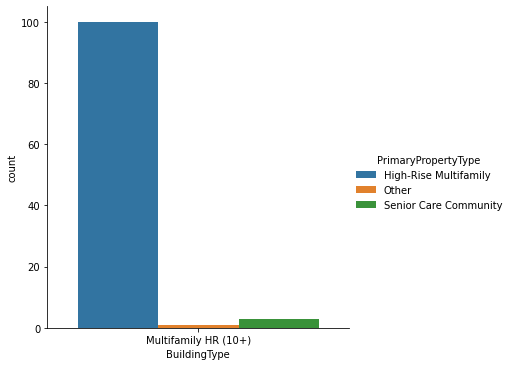

In [62]:
g = sns.catplot(x="BuildingType", hue="PrimaryPropertyType", data=data1[data1["BuildingType"] == "Multifamily HR (10+)"], kind = 'count', legend_out = True)

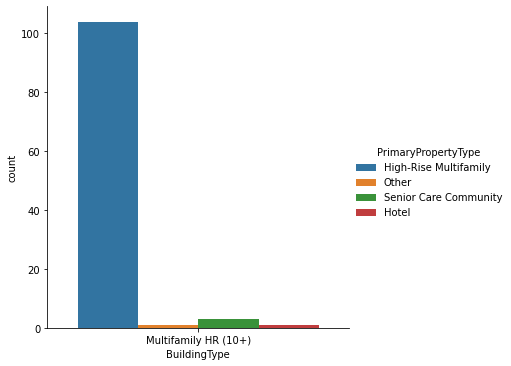

In [63]:
g = sns.catplot(x="BuildingType", hue="PrimaryPropertyType", data=data2[data2["BuildingType"] == "Multifamily HR (10+)"], kind = 'count', legend_out = True)

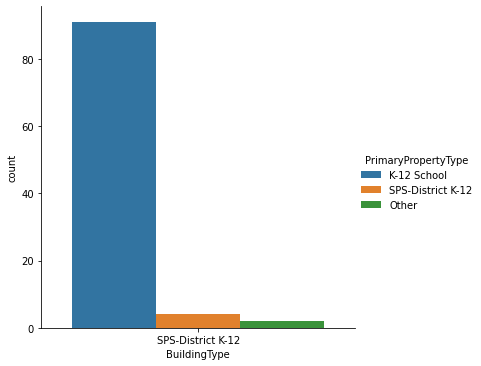

In [64]:
g = sns.catplot(x="BuildingType", hue="PrimaryPropertyType", data=data1[data1["BuildingType"] == "SPS-District K-12"], kind = 'count', legend_out = True)

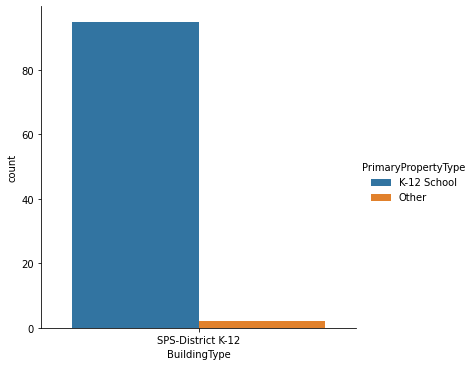

In [65]:
g = sns.catplot(x="BuildingType", hue="PrimaryPropertyType", data=data2[data2["BuildingType"] == "SPS-District K-12"], kind = 'count', legend_out = True)

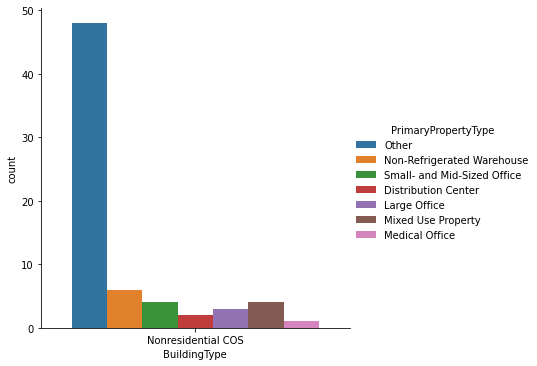

In [66]:
g = sns.catplot(x="BuildingType", hue="PrimaryPropertyType", data=data1[data1["BuildingType"] == "Nonresidential COS"], kind = 'count', legend_out = True)

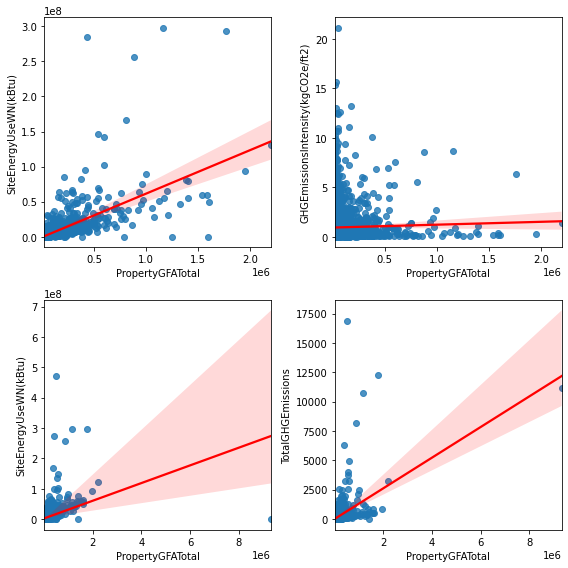

In [67]:

f, axs = plt.subplots(2, 2, figsize=(8, 8), gridspec_kw=dict(width_ratios=[5, 5]))
sns.regplot(x = 'PropertyGFATotal'  , y = "SiteEnergyUseWN(kBtu)", data = data1, line_kws={'color':'red'},ax=axs[0,0])
sns.regplot(x = 'PropertyGFATotal'  , y = 'GHGEmissionsIntensity(kgCO2e/ft2)', data = data1, line_kws={'color':'red'}, ax=axs[0,1])
sns.regplot(x = 'PropertyGFATotal'  , y = "SiteEnergyUseWN(kBtu)", data = data2,line_kws={'color':'red'}, ax=axs[1,0])
sns.regplot(x = 'PropertyGFATotal'  , y = 'TotalGHGEmissions', data = data2,line_kws={'color':'red'}, ax=axs[1,1])

f.tight_layout()

(array([0.e+00, 2.e+07, 4.e+07, 6.e+07, 8.e+07, 1.e+08]),
 [Text(0, -50000000.0, '−0.5'),
  Text(0, 0.0, '0.0'),
  Text(0, 50000000.0, '0.5'),
  Text(0, 100000000.0, '1.0'),
  Text(0, 150000000.0, '1.5'),
  Text(0, 200000000.0, '2.0')])

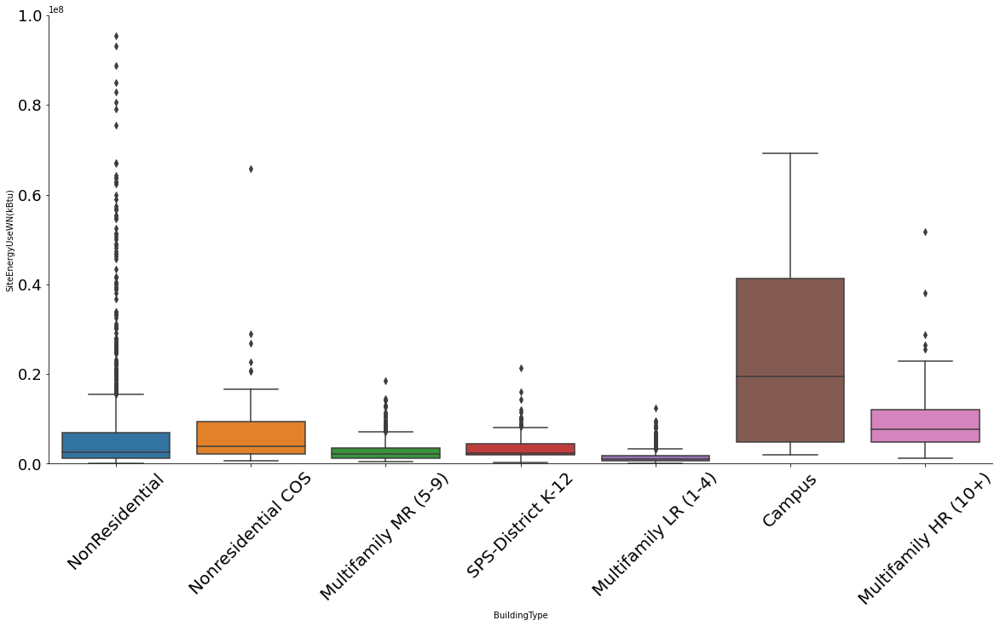

In [37]:
ax = sns.catplot(x = 'BuildingType' , y = "SiteEnergyUseWN(kBtu)", data = data1 ,kind='box',  height=8, aspect=2)
plt.ylim(0,1e8)
plt.xticks(rotation = 45, fontsize = 20)


(array([0, 1, 2, 3, 4, 5, 6]),
 [Text(0, 0, 'NonResidential'),
  Text(1, 0, 'Nonresidential COS'),
  Text(2, 0, 'Multifamily MR (5-9)'),
  Text(3, 0, 'SPS-District K-12'),
  Text(4, 0, 'Multifamily LR (1-4)'),
  Text(5, 0, 'Campus'),
  Text(6, 0, 'Multifamily HR (10+)')])

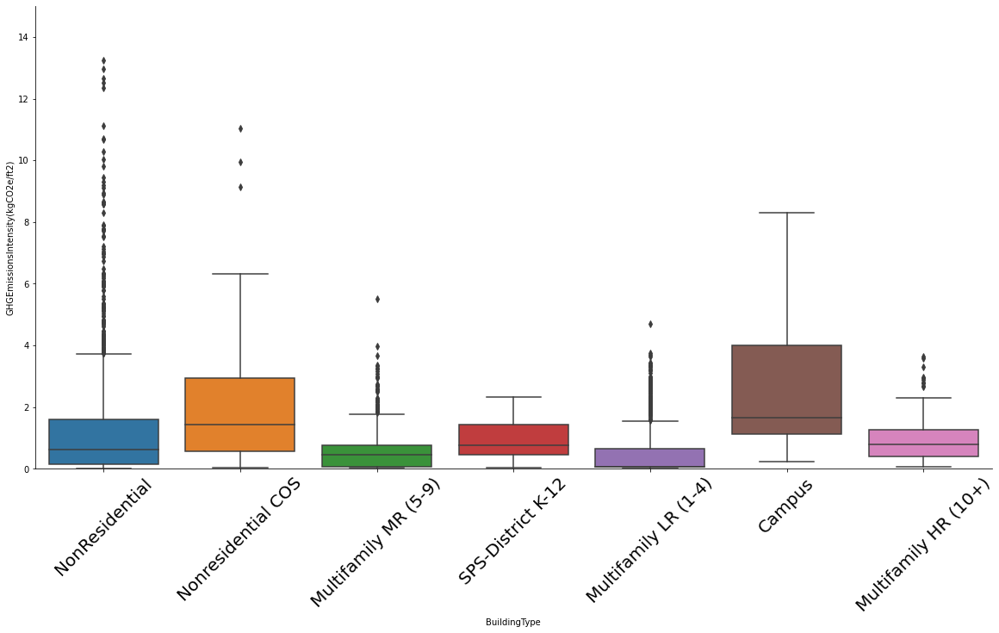

In [36]:
sns.catplot(x = 'BuildingType' , y = 'GHGEmissionsIntensity(kgCO2e/ft2)', data = data1 ,kind='box', height=8, aspect=2)
plt.ylim(0,15)
plt.xticks(rotation = 45, fontsize = 20)

(array([0, 1, 2, 3, 4, 5, 6, 7]),
 [Text(0, 0, 'NonResidential'),
  Text(1, 0, 'Nonresidential COS'),
  Text(2, 0, 'Multifamily MR (5-9)'),
  Text(3, 0, 'SPS-District K-12'),
  Text(4, 0, 'Campus'),
  Text(5, 0, 'Multifamily LR (1-4)'),
  Text(6, 0, 'Multifamily HR (10+)'),
  Text(7, 0, 'Nonresidential WA')])

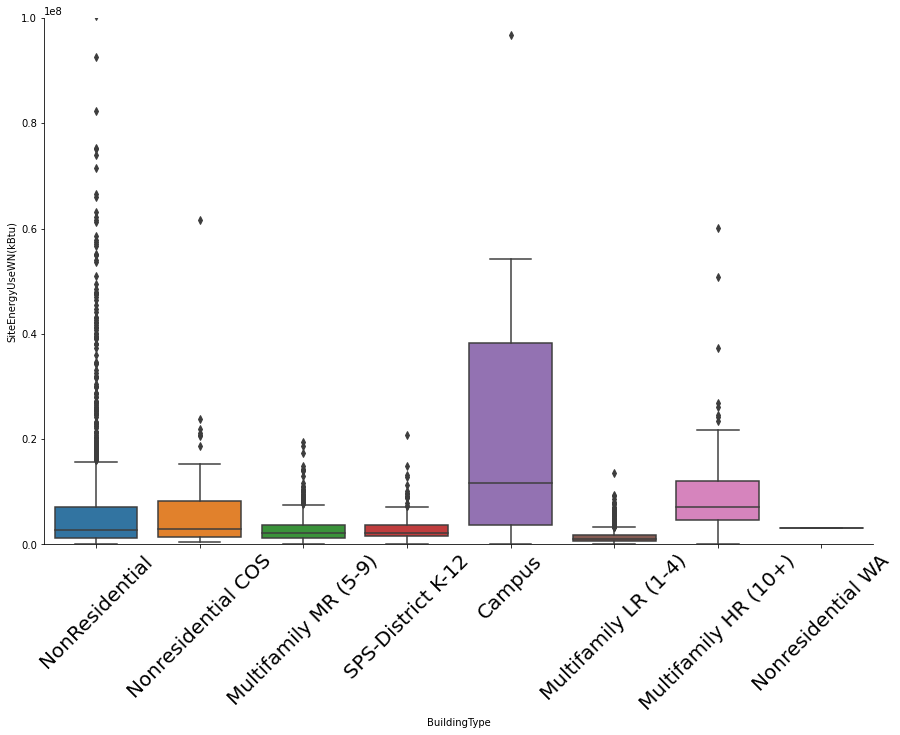

In [38]:
sns.catplot(x = 'BuildingType' , y = "SiteEnergyUseWN(kBtu)", data = data2 ,kind='box', height=8, aspect=1.5)
plt.ylim(0,1e8)
plt.xticks(rotation = 45, fontsize = 20)

(array([0, 1, 2, 3, 4, 5, 6, 7]),
 [Text(0, 0, 'NonResidential'),
  Text(1, 0, 'Nonresidential COS'),
  Text(2, 0, 'Multifamily MR (5-9)'),
  Text(3, 0, 'SPS-District K-12'),
  Text(4, 0, 'Campus'),
  Text(5, 0, 'Multifamily LR (1-4)'),
  Text(6, 0, 'Multifamily HR (10+)'),
  Text(7, 0, 'Nonresidential WA')])

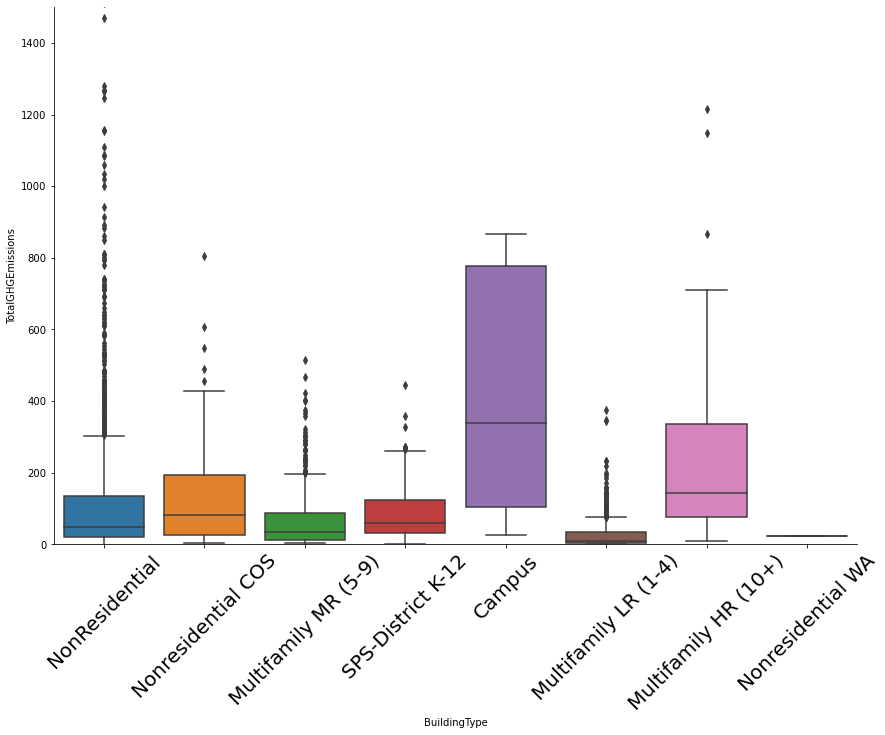

In [39]:
sns.catplot(x = 'BuildingType' , y = 'TotalGHGEmissions', data = data2 ,kind='box',height=8, aspect=1.5)
plt.ylim(0,1500)
plt.xticks(rotation = 45, fontsize = 20)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13]),
 [Text(0, 0, 'downtown'),
  Text(1, 0, 'southeast'),
  Text(2, 0, 'northeast'),
  Text(3, 0, 'east'),
  Text(4, 0, 'central'),
  Text(5, 0, 'north'),
  Text(6, 0, 'magnolia / queen anne'),
  Text(7, 0, 'lake union'),
  Text(8, 0, 'greater duwamish'),
  Text(9, 0, 'ballard'),
  Text(10, 0, 'northwest'),
  Text(11, 0, 'southwest'),
  Text(12, 0, 'delridge'),
  Text(13, 0, 'delridge neighborhoods')])

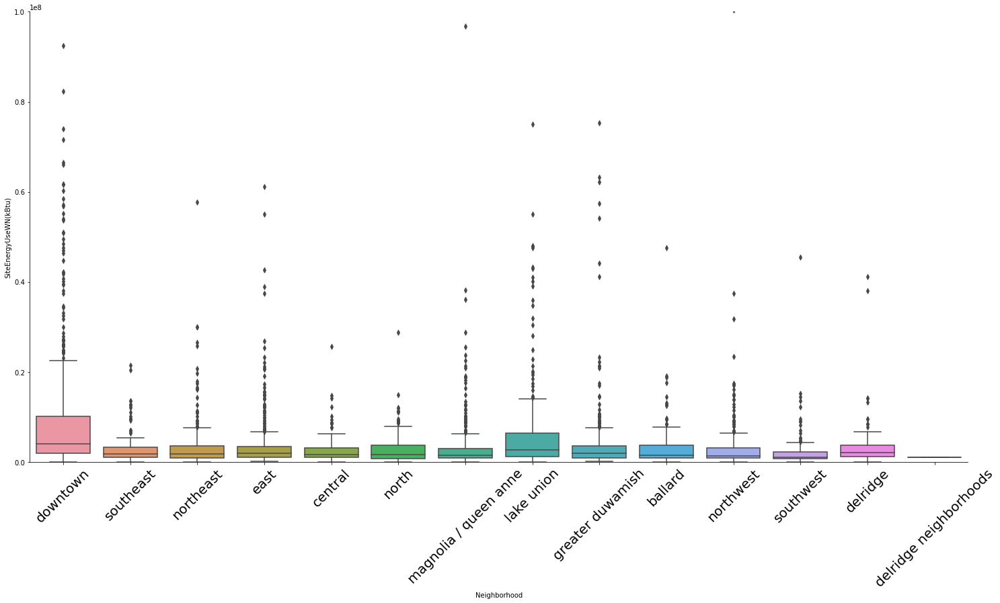

In [40]:
sns.catplot(x = 'Neighborhood' , y ="SiteEnergyUseWN(kBtu)", data = data2 ,kind='box',height=10, aspect=2)
plt.ylim(0,1e8)
plt.xticks(rotation = 45, fontsize = 20)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13]),
 [Text(0, 0, 'downtown'),
  Text(1, 0, 'southeast'),
  Text(2, 0, 'northeast'),
  Text(3, 0, 'east'),
  Text(4, 0, 'central'),
  Text(5, 0, 'north'),
  Text(6, 0, 'magnolia / queen anne'),
  Text(7, 0, 'lake union'),
  Text(8, 0, 'greater duwamish'),
  Text(9, 0, 'ballard'),
  Text(10, 0, 'northwest'),
  Text(11, 0, 'southwest'),
  Text(12, 0, 'delridge'),
  Text(13, 0, 'delridge neighborhoods')])

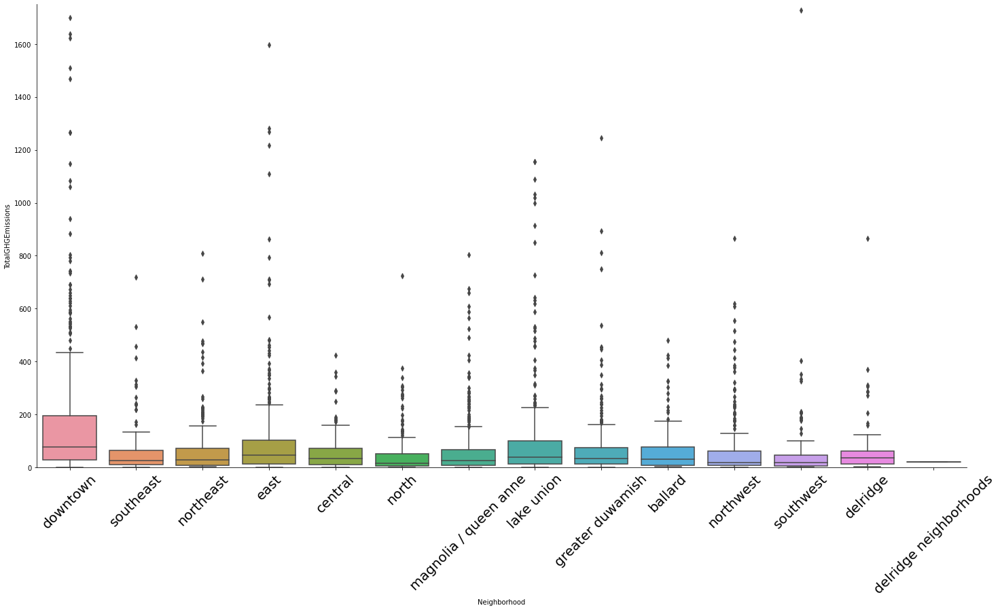

In [41]:
sns.catplot(x = 'Neighborhood' , y = 'TotalGHGEmissions', data = data2 ,kind='box',height=10, aspect=2)
plt.ylim(0,1750)
plt.xticks(rotation = 45, fontsize = 20)

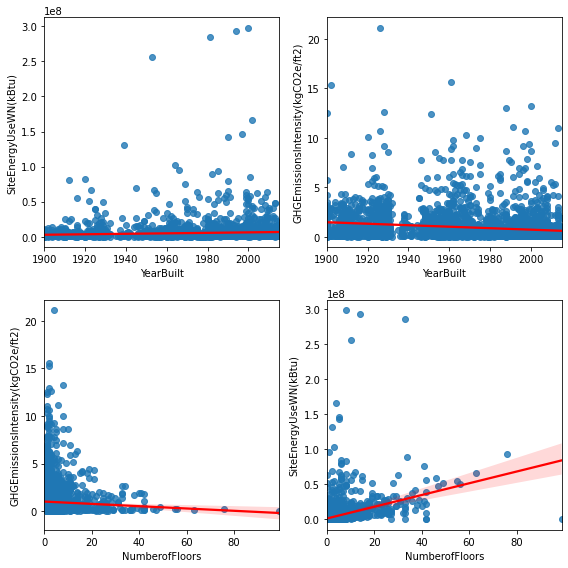

In [74]:
f, axs = plt.subplots(2, 2, figsize=(8, 8), gridspec_kw=dict(width_ratios=[5, 5]))
sns.regplot(x = 'YearBuilt' , y = "SiteEnergyUseWN(kBtu)", data = data1, line_kws={'color':'red'},ax=axs[0,0])
sns.regplot(x = 'YearBuilt' , y = 'GHGEmissionsIntensity(kgCO2e/ft2)', data = data1, line_kws={'color':'red'}, ax=axs[0,1])
sns.regplot(x = 'NumberofFloors' , y = 'GHGEmissionsIntensity(kgCO2e/ft2)', data = data1,line_kws={'color':'red'}, ax=axs[1,0])
sns.regplot(x = 'NumberofFloors' , y = "SiteEnergyUseWN(kBtu)", data = data1, line_kws={'color':'red'}, ax=axs[1,1])
f.tight_layout()

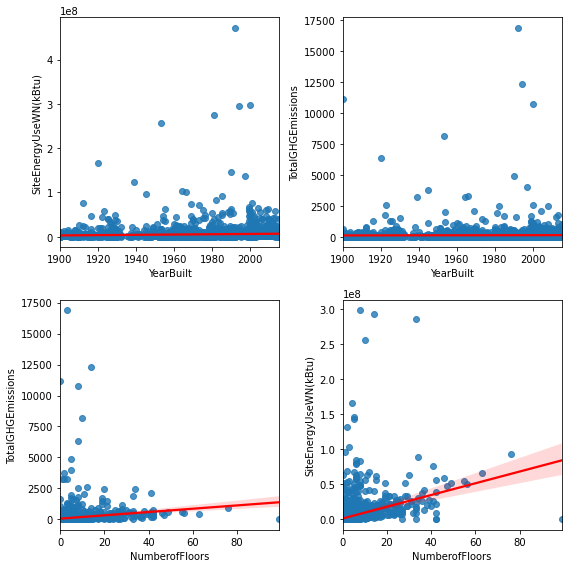

In [75]:
f, axs = plt.subplots(2, 2, figsize=(8, 8), gridspec_kw=dict(width_ratios=[5, 5]))
sns.regplot(x = 'YearBuilt' , y = "SiteEnergyUseWN(kBtu)", data = data2, line_kws={'color':'red'},ax=axs[0,0])
sns.regplot(x = 'YearBuilt' , y = 'TotalGHGEmissions', data = data2, line_kws={'color':'red'}, ax=axs[0,1])
sns.regplot(x = 'NumberofFloors' , y = 'TotalGHGEmissions', data = data2,line_kws={'color':'red'}, ax=axs[1,0])
sns.regplot(x = 'NumberofFloors' , y = "SiteEnergyUseWN(kBtu)", data = data1, line_kws={'color':'red'}, ax=axs[1,1])
f.tight_layout()

C:\Users\agar.blohorn\anaconda3\lib\site-packages\seaborn\distributions.py:306: UserWarning:

Dataset has 0 variance; skipping density estimate.



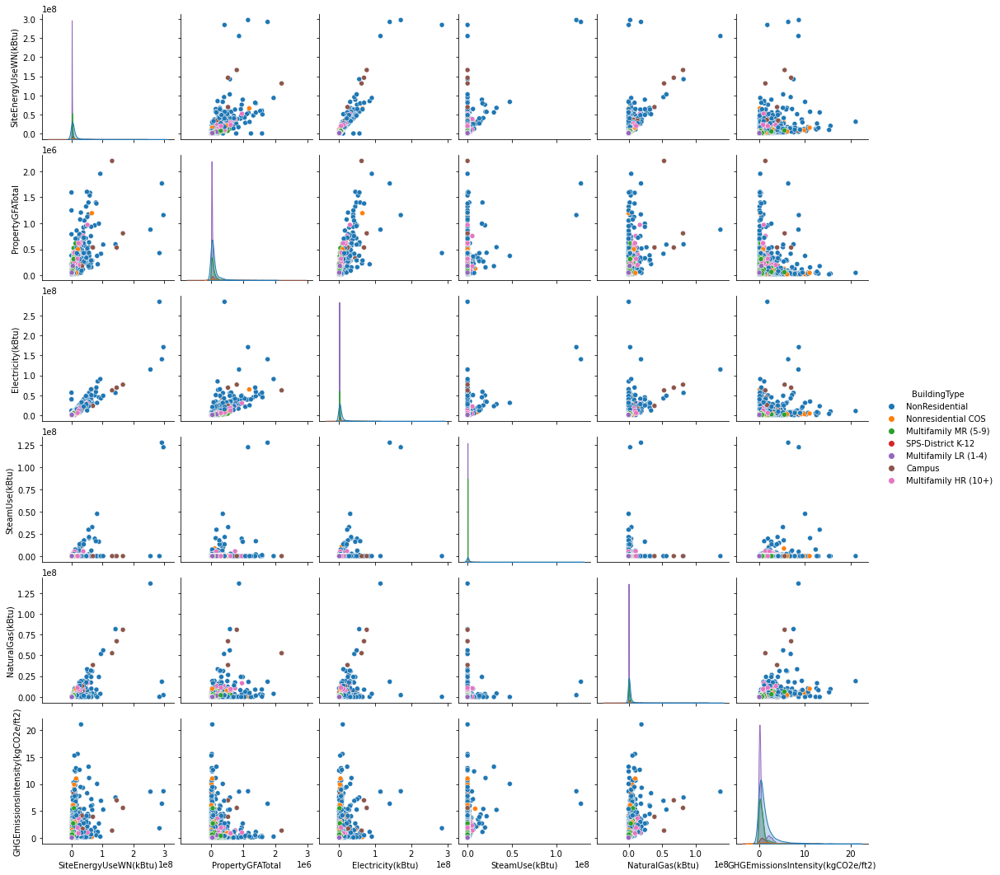

In [76]:
sns.pairplot(data1, hue = "BuildingType", vars=["SiteEnergyUseWN(kBtu)",'PropertyGFATotal','Electricity(kBtu)','SteamUse(kBtu)','NaturalGas(kBtu)','GHGEmissionsIntensity(kgCO2e/ft2)'])


C:\Users\agar.blohorn\anaconda3\lib\site-packages\seaborn\distributions.py:306: UserWarning:

Dataset has 0 variance; skipping density estimate.

C:\Users\agar.blohorn\anaconda3\lib\site-packages\seaborn\distributions.py:306: UserWarning:

Dataset has 0 variance; skipping density estimate.

C:\Users\agar.blohorn\anaconda3\lib\site-packages\seaborn\distributions.py:306: UserWarning:

Dataset has 0 variance; skipping density estimate.

C:\Users\agar.blohorn\anaconda3\lib\site-packages\seaborn\distributions.py:306: UserWarning:

Dataset has 0 variance; skipping density estimate.

C:\Users\agar.blohorn\anaconda3\lib\site-packages\seaborn\distributions.py:306: UserWarning:

Dataset has 0 variance; skipping density estimate.

C:\Users\agar.blohorn\anaconda3\lib\site-packages\seaborn\distributions.py:306: UserWarning:

Dataset has 0 variance; skipping density estimate.

C:\Users\agar.blohorn\anaconda3\lib\site-packages\seaborn\distributions.py:306: UserWarning:

Dataset has 0 variance; skippi

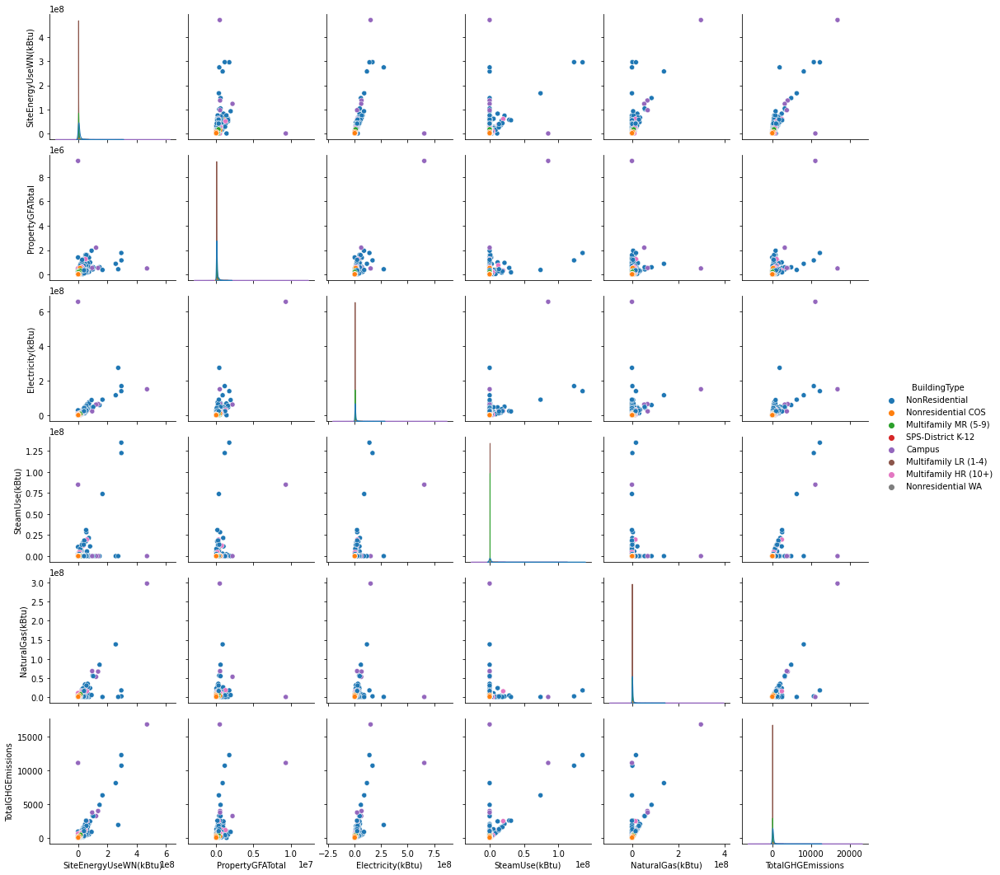

In [77]:
sns.pairplot(data2, hue = "BuildingType", vars = ["SiteEnergyUseWN(kBtu)",'PropertyGFATotal','Electricity(kBtu)','SteamUse(kBtu)','NaturalGas(kBtu)','TotalGHGEmissions'])

C:\Users\agar.blohorn\anaconda3\lib\site-packages\seaborn\distributions.py:306: UserWarning:

Dataset has 0 variance; skipping density estimate.

C:\Users\agar.blohorn\anaconda3\lib\site-packages\seaborn\distributions.py:306: UserWarning:

Dataset has 0 variance; skipping density estimate.

C:\Users\agar.blohorn\anaconda3\lib\site-packages\seaborn\distributions.py:306: UserWarning:

Dataset has 0 variance; skipping density estimate.

C:\Users\agar.blohorn\anaconda3\lib\site-packages\seaborn\distributions.py:306: UserWarning:

Dataset has 0 variance; skipping density estimate.

C:\Users\agar.blohorn\anaconda3\lib\site-packages\seaborn\distributions.py:306: UserWarning:

Dataset has 0 variance; skipping density estimate.

C:\Users\agar.blohorn\anaconda3\lib\site-packages\seaborn\distributions.py:306: UserWarning:

Dataset has 0 variance; skipping density estimate.

C:\Users\agar.blohorn\anaconda3\lib\site-packages\seaborn\distributions.py:306: UserWarning:

Dataset has 0 variance; skippi

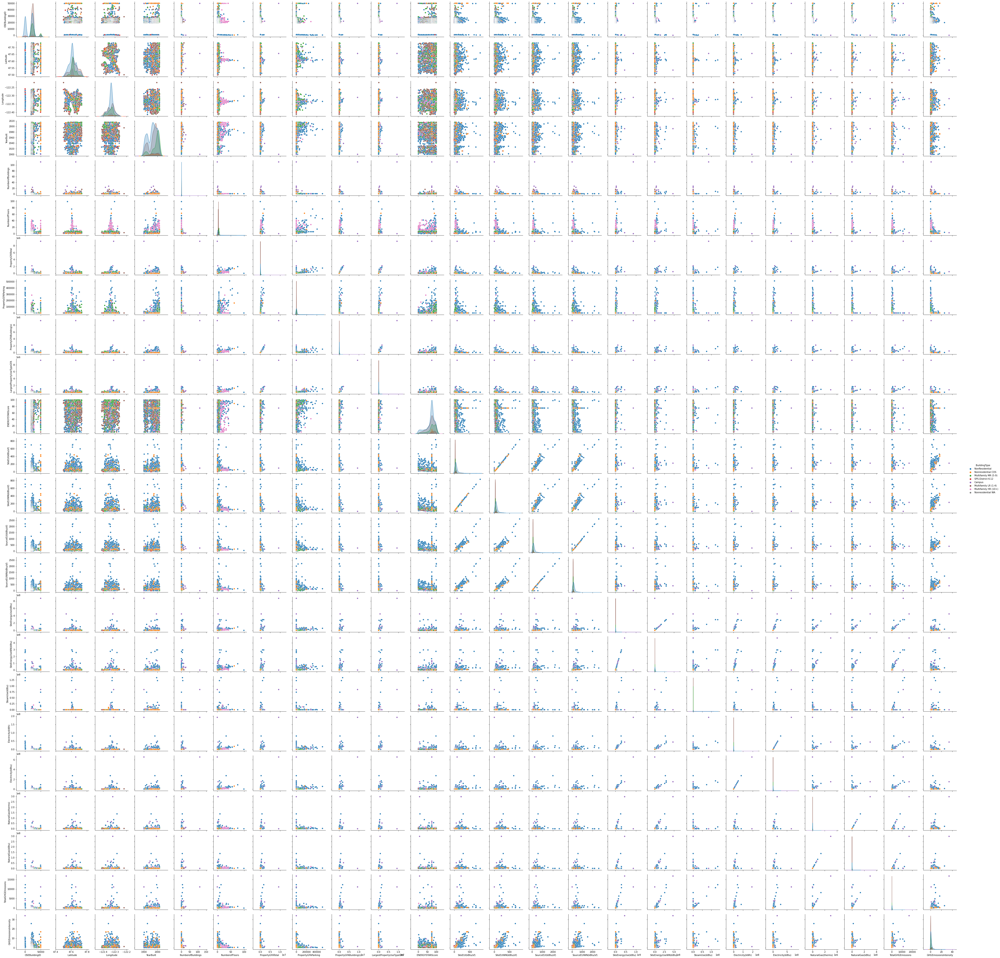

In [78]:
sns.pairplot(data2, hue = "BuildingType")

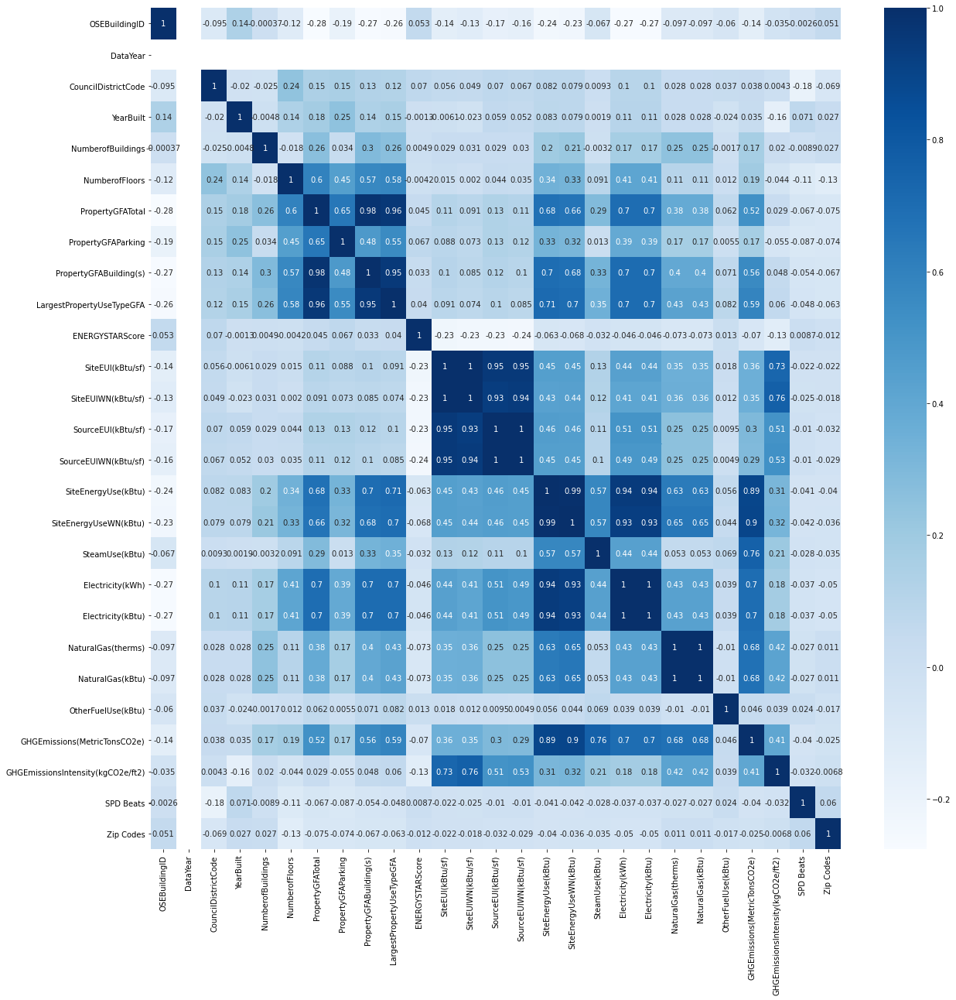

In [79]:
data1_numerique = data1.select_dtypes(include=[np.number])
plt.figure(figsize = (20,20))
sns.heatmap(data1_numerique.corr(),cmap="Blues", annot = True)
plt.show()

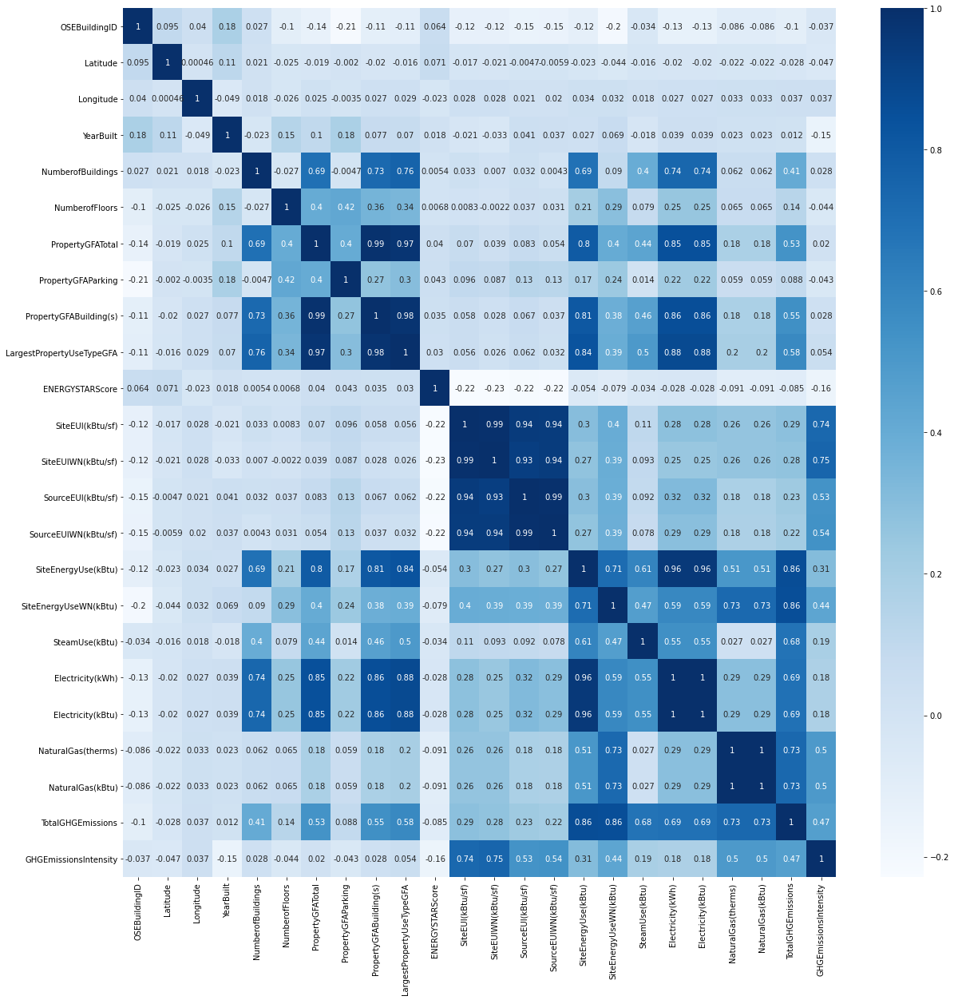

In [80]:
data2_numerique = data2.select_dtypes(include=[np.number])
plt.figure(figsize = (20,20))
sns.heatmap(data2_numerique.corr(),cmap="Blues", annot = True)
plt.show()

### Transformation des variables liées à la fuite de données en variables exploitables à l'aide d'une binarization

Les colonnes 'SteamUse(kBtu)' 'Electricity(kWh)'
 'Electricity(kBtu)' 'NaturalGas(therms)' 'NaturalGas(kBtu)'
 'OtherFuelUse(kBtu)' peuvent être responsable des fuites de données (data leakage en anglais). Pour pallier à ce souci, je vais les rendre binaires :  0 le batiment n'a pas besoin d'élerctricité ect, 1 il a besoin d'electricité...

In [81]:
colonne = ['SteamUse(kBtu)', 'Electricity(kWh)', 'Electricity(kBtu)', 'NaturalGas(therms)','NaturalGas(kBtu)']

In [82]:
data2[colonne]

,SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu)
0,2.003882e+06,1.156514e+06,3.946027e+06,1.276453e+04,1.276453e+06
1,0.000000e+00,9.504252e+05,3.242851e+06,5.145082e+04,5.145082e+06
2,2.156655e+07,1.451544e+07,4.952666e+07,1.493800e+04,1.493800e+06
3,2.214446e+06,8.115253e+05,2.768924e+06,1.811213e+04,1.811213e+06
4,0.000000e+00,1.573449e+06,5.368607e+06,8.803998e+04,8.803998e+06
5,0.000000e+00,2.160444e+06,7.371434e+06,4.715182e+04,4.715182e+06
6,0.000000e+00,8.239199e+05,2.811215e+06,2.947580e+04,2.947580e+06
7,2.276286e+06,1.065843e+06,3.636655e+06,3.851890e+03,3.851890e+05
8,0.000000e+00,2.138898e+06,7.297919e+06,6.425900e+04,6.425900e+06
9,1.039735e+06,7.420912e+05,2.532015e+06,1.002026e+04,1.002026e+06


In [83]:
for i in colonne:
    data2.loc[data2[i]>0.0, i]= 1
    data2.loc[data2[i] <= 0.0, i]= 0
   

In [84]:
data2[colonne]

,SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu)
0,1.0,1.0,1.0,1.0,1.0
1,0.0,1.0,1.0,1.0,1.0
2,1.0,1.0,1.0,1.0,1.0
3,1.0,1.0,1.0,1.0,1.0
4,0.0,1.0,1.0,1.0,1.0
5,0.0,1.0,1.0,1.0,1.0
6,0.0,1.0,1.0,1.0,1.0
7,1.0,1.0,1.0,1.0,1.0
8,0.0,1.0,1.0,1.0,1.0
9,1.0,1.0,1.0,1.0,1.0


In [85]:
data2.head()

,OSEBuildingID,BuildingType,PrimaryPropertyType,PropertyName,Address,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity
0,1,NonResidential,Hotel,Mayflower park hotel,405 Olive way,downtown,47.61220,-122.33799,1927,1.0,12,88434,0,88434,Hotel,Hotel,88434.0,60.0,81.699997,84.300003,182.500000,189.000000,7226362.5,7456910.0,1.0,1.0,1.0,1.0,1.0,249.98,2.83
1,2,NonResidential,Hotel,Paramount Hotel,724 Pine street,downtown,47.61317,-122.33393,1996,1.0,11,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.0,61.0,94.800003,97.900002,176.100006,179.399994,8387933.0,8664479.0,0.0,1.0,1.0,1.0,1.0,295.86,2.86
2,3,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,downtown,47.61393,-122.33810,1969,1.0,41,956110,196718,759392,Hotel,Hotel,756493.0,43.0,96.000000,97.699997,241.899994,244.100006,72587024.0,73937112.0,1.0,1.0,1.0,1.0,1.0,2089.28,2.19
3,5,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,downtown,47.61412,-122.33664,1926,1.0,10,61320,0,61320,Hotel,Hotel,61320.0,56.0,110.800003,113.300003,216.199997,224.000000,6794584.0,6946800.5,1.0,1.0,1.0,1.0,1.0,286.43,4.67
4,8,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,downtown,47.61375,-122.34047,1980,1.0,18,175580,62000,113580,"Hotel, Parking, Swimming Pool",Hotel,123445.0,75.0,114.800003,118.699997,211.399994,215.600006,14172606.0,14656503.0,0.0,1.0,1.0,1.0,1.0,505.01,2.88


In [86]:
#selectionner les colonnes numeriques et colonnes categorielles
data1_numerique = data1.select_dtypes(include=[np.number])
num_cols = data1_numerique.columns.values
data1_categ = data1.select_dtypes(exclude=[np.number])
categ_cols = data1_categ.columns.values
print(num_cols)
print('\n')
print(categ_cols)

['OSEBuildingID' 'DataYear' 'CouncilDistrictCode' 'YearBuilt'
 'NumberofBuildings' 'NumberofFloors' 'PropertyGFATotal'
 'PropertyGFAParking' 'PropertyGFABuilding(s)' 'LargestPropertyUseTypeGFA'
 'ENERGYSTARScore' 'SiteEUI(kBtu/sf)' 'SiteEUIWN(kBtu/sf)'
 'SourceEUI(kBtu/sf)' 'SourceEUIWN(kBtu/sf)' 'SiteEnergyUse(kBtu)'
 'SiteEnergyUseWN(kBtu)' 'SteamUse(kBtu)' 'Electricity(kWh)'
 'Electricity(kBtu)' 'NaturalGas(therms)' 'NaturalGas(kBtu)'
 'OtherFuelUse(kBtu)' 'GHGEmissions(MetricTonsCO2e)'
 'GHGEmissionsIntensity(kgCO2e/ft2)' 'SPD Beats' 'Zip Codes']


['BuildingType' 'PrimaryPropertyType' 'PropertyName' 'Location'
 'Neighborhood' 'ListOfAllPropertyUseTypes' 'LargestPropertyUseType'
 'ComplianceStatus']


In [87]:
data2_numerique = data2.select_dtypes(include=[np.number])
num_cols2 = data2_numerique.columns.values
data2_categ = data2.select_dtypes(exclude=[np.number])
categ_cols2 = data2_categ.columns.values
print(num_cols2)
print('\n')
print(categ_cols2)

['OSEBuildingID' 'Latitude' 'Longitude' 'YearBuilt' 'NumberofBuildings'
 'NumberofFloors' 'PropertyGFATotal' 'PropertyGFAParking'
 'PropertyGFABuilding(s)' 'LargestPropertyUseTypeGFA' 'ENERGYSTARScore'
 'SiteEUI(kBtu/sf)' 'SiteEUIWN(kBtu/sf)' 'SourceEUI(kBtu/sf)'
 'SourceEUIWN(kBtu/sf)' 'SiteEnergyUse(kBtu)' 'SiteEnergyUseWN(kBtu)'
 'SteamUse(kBtu)' 'Electricity(kWh)' 'Electricity(kBtu)'
 'NaturalGas(therms)' 'NaturalGas(kBtu)' 'TotalGHGEmissions'
 'GHGEmissionsIntensity']


['BuildingType' 'PrimaryPropertyType' 'PropertyName' 'Address'
 'Neighborhood' 'ListOfAllPropertyUseTypes' 'LargestPropertyUseType']


Je vais concatener les données de 2015 et 2016

In [88]:
data1 = data1.rename(columns = {'GHGEmissions(MetricTonsCO2e)': 'TotalGHGEmissions', 'GHGEmissionsIntensity(kgCO2e/ft2)' : 'GHGEmissionsIntensity'})

Seattle_energy = pd.concat([data1, data2])

In [89]:
data2.to_csv('2016data2.csv')